In [13]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import f, t, rayleigh, binom
import scipy.stats as stats
import random
import math
import seaborn as sns

# Pregunta 1

## Pregunta (1) a i
Determine la media y esperanza de gente promedio en el hospital

In [14]:
muestra1 = pd.read_excel('muestra1.xlsx', 'Sheet1', usecols = 'A', header = None)
personas = np.array(muestra1[0])

print(f' El promedio de personas en el hospital es de {round(personas.mean(), 2)}') #Promedio 448.63
print(f' La varianza de personas en el hospital es de {round(personas.var(ddof = 1), 2)}') #Varianza 14459.36 

 El promedio de personas en el hospital es de 448.63
 La varianza de personas en el hospital es de 14507.72


## Pregunta (1) a ii
Considerando algun Warm-Up, determine la cantidad de gente promedio en el hospital y la varianza. Analice como la inclusión de un warmup afecta el analisis de rendimiento del hospital.

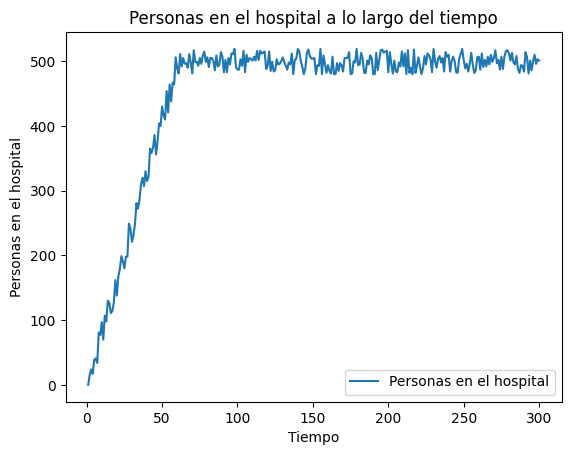

In [15]:
dominio = [x for x in range(1,301)]
plt.plot(dominio, personas, label = 'Personas en el hospital')
plt.title('Personas en el hospital a lo largo del tiempo')
plt.xlabel('Tiempo')
plt.ylabel('Personas en el hospital')
plt.legend()
plt.show()

En el gráfico se puede apreciar que un tiempo de Warm-Up adecuado sería al rededor del 
t = 58, dado que para este punto la cantidad de personas en el hospital se estabiliza. 
Por simplicidad, se puede escoger t = 58 o t = 60 (el segundo para un número más redondo)
Escogeremos t = 60 para trabajar con numeros más redondos

241


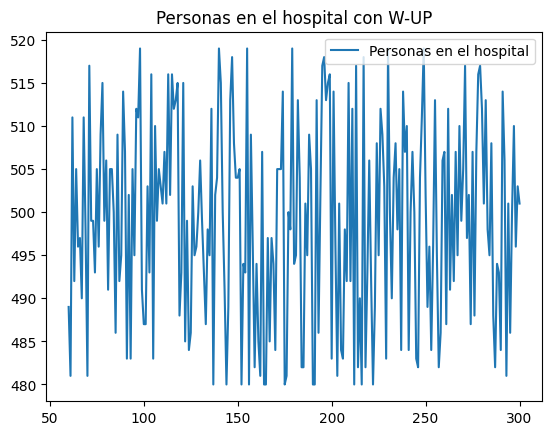

 El promedio de personas en el hospital, despues del Warm-Up, es de 498.97
 La varianza de personas en el hospital es de 131.5


In [16]:
personas = personas[59:]
print(len(personas))
dominio = [x for x in range(60, 301)]
plt.plot(dominio, personas, label = 'Personas en el hospital')
plt.title('Personas en el hospital con W-UP')
plt.legend()
plt.show()
print(f' El promedio de personas en el hospital, despues del Warm-Up, es de {round(personas.mean(), 2)}') #Promedio 498.97
print(f' La varianza de personas en el hospital es de {round(personas.var(ddof = 1), 2)}') #Varianza 131.5

La varianza es mucho menor, por lo que la esperanza obtenida es mucho más representativa sobre las personas
en el hospital al largo plazo. Si, pagando el precio de ignorar los datos de calentamiento e inicio de servicios,
se puede obtener información más precisa del funcionamiento al largo plazo. Al final del día, las emrpesas buscan
optimizar sus utilidades al largo plazo y no dia a dia.

## Pregunta 1 b iii
Divida en Batches, explicando su decision y el tamaño de cada uno. Calcule la media y varianza de cada batch.

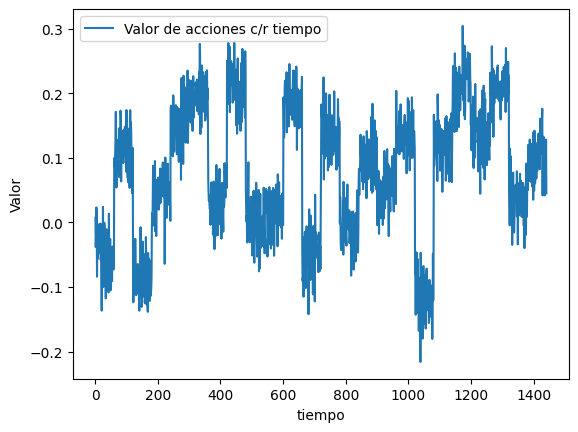

In [17]:
acciones = pd.read_excel('muestra2.xlsx', 'Sheet1', header = None)
dominio = [x for x in range(1, len(acciones) + 1)]
acciones = np.array(acciones[0])

plt.plot(dominio, acciones, label = 'Valor de acciones c/r tiempo')
plt.xlabel('tiempo')
plt.ylabel('Valor')
plt.legend()
plt.show()

Tanto en el gráfico como en el archivo excel, se puede apreciar que ocurre un cambio brusco en los precios al rededor de cada 60 unidades de tiempo. Gracias a esto, usaremos los 1440 datos para crear 24 batches de tamaño 60.

In [18]:
n = 24 #Número de intervalo (b)
d = len(acciones) // n #Tamaño del intervalo (m)
esperanzas = []
varianzas = []
for i in range(1, n + 1):
    liminf = (i - 1) * d
    if i == n:
        limsup = len(acciones)
    else:
        limsup = i * (d)
    intervalo = acciones[liminf: limsup]
    esperanza = np.mean(intervalo)
    esperanzas.append(esperanza)
    varianza = np.var(intervalo, ddof = 1)
    varianzas.append(varianza)
    print(f'Esperanza/Varianza del batch n°{i}: {round(esperanza, 4)} // {round(varianza, 4)}')
mu = round(np.mean(esperanzas), 4)
Vb = round(np.sum(varianzas) / (n) + np.sum(np.var(esperanzas)), 4)
Vb = np.var(esperanzas, ddof = 1)
print(f'\nLa media de la esperanza de todos los batches es de: {mu}')

Esperanza/Varianza del batch n°1: -0.049 // 0.0013
Esperanza/Varianza del batch n°2: 0.1157 // 0.0011
Esperanza/Varianza del batch n°3: -0.0865 // 0.001
Esperanza/Varianza del batch n°4: 0.0447 // 0.001
Esperanza/Varianza del batch n°5: 0.1572 // 0.0012
Esperanza/Varianza del batch n°6: 0.1961 // 0.0009
Esperanza/Varianza del batch n°7: 0.0332 // 0.001
Esperanza/Varianza del batch n°8: 0.2129 // 0.0012
Esperanza/Varianza del batch n°9: 0.0008 // 0.0013
Esperanza/Varianza del batch n°10: 0.0141 // 0.001
Esperanza/Varianza del batch n°11: 0.1875 // 0.0008
Esperanza/Varianza del batch n°12: -0.0482 // 0.0014
Esperanza/Varianza del batch n°13: 0.1381 // 0.0011
Esperanza/Varianza del batch n°14: -0.0044 // 0.0008
Esperanza/Varianza del batch n°15: 0.0909 // 0.0011
Esperanza/Varianza del batch n°16: 0.0525 // 0.001
Esperanza/Varianza del batch n°17: 0.1361 // 0.0008
Esperanza/Varianza del batch n°18: -0.1152 // 0.0013
Esperanza/Varianza del batch n°19: 0.1204 // 0.001
Esperanza/Varianza del 

## Pregunta 1 b iv

In [19]:
alpha = 0.05

Vb *= 60 #Varianza ajustada según fórmula de ayudantía 5.
print(Vb)
liminf = mu - np.sqrt(Vb / n) * t.ppf(1 - alpha/2, n - 1)
limsup = mu + np.sqrt(Vb / n) * t.ppf(1 - alpha/2, n - 1)
print(f'Intervalo de confianza: [{round(liminf, 5)} , {round(limsup, 5)}]')

0.5744802768720939
Intervalo de confianza: [-0.24125 , 0.39885]


El intervalo de confianza [0.05, 0.1] indica que existe un 95% de probabilidad de que el valor esperado de las acciones pertenezca a ese intervalo. Este intervaloq quiere decir que con un 95% de probabilidad, las inversiones serán rentables. 

# Pregunta 2

## Pregunta 2 d

In [20]:
n = 3  
p = 0.5  
m = 4  
Sx, Sy = 3, 5  
sx, sy = 1, 2  

estados = [(x, y) for x in range(sx, Sx + 1) for y in range(sy, Sy + 1)]
num_estados = len(estados)

matriz_transicion = np.zeros((num_estados, num_estados))

def indice_estado(x, y):
    return estados.index((x, y))

def probabilidad_demanda_gomitas(d):
    return binom.pmf(d, n, p)

def probabilidad_demanda_huevitos(d):
    return 1 / (m + 1) if 0 <= d <= m else 0

for i, (x_t, y_t) in enumerate(estados):
    for d_gomitas in range(n + 1):  
        for d_huevitos in range(m + 1):  
            
            if x_t - d_gomitas < sx:
                nuevo_x = Sx  
            else:
                nuevo_x = max(sx, min(x_t - d_gomitas, Sx))  

            if y_t - d_huevitos < sy:
                nuevo_y = Sy  
            else:
                nuevo_y = max(sy, min(y_t - d_huevitos, Sy)) 

            j = indice_estado(nuevo_x, nuevo_y)

            prob_transicion = probabilidad_demanda_gomitas(d_gomitas) * probabilidad_demanda_huevitos(d_huevitos)
            matriz_transicion[i, j] += prob_transicion


#* DataFrame con los índices para que quede bonito
df_matriz_transicion = pd.DataFrame(matriz_transicion, 
                                    index=[f"({x},{y})" for x, y in estados], 
                                    columns=[f"({x},{y})" for x, y in estados])

print("Matriz de probabilidades de transición con estados:")
print(df_matriz_transicion)

# TODO: Verificar!
for i in range(len(matriz_transicion)):
    suma_fila = np.sum(matriz_transicion[i, :])
    print(f"Fila {i} suma: {suma_fila}")
    

Matriz de probabilidades de transición con estados:
       (1,2)  (1,3)  (1,4)  (1,5)  (2,2)  (2,3)  (2,4)  (2,5)  (3,2)  (3,3)  \
(1,2)  0.025  0.000  0.000  0.100  0.000  0.000  0.000  0.000  0.175  0.000   
(1,3)  0.025  0.025  0.000  0.075  0.000  0.000  0.000  0.000  0.175  0.175   
(1,4)  0.025  0.025  0.025  0.050  0.000  0.000  0.000  0.000  0.175  0.175   
(1,5)  0.025  0.025  0.025  0.050  0.000  0.000  0.000  0.000  0.175  0.175   
(2,2)  0.075  0.000  0.000  0.300  0.025  0.000  0.000  0.100  0.100  0.000   
(2,3)  0.075  0.075  0.000  0.225  0.025  0.025  0.000  0.075  0.100  0.100   
(2,4)  0.075  0.075  0.075  0.150  0.025  0.025  0.025  0.050  0.100  0.100   
(2,5)  0.075  0.075  0.075  0.150  0.025  0.025  0.025  0.050  0.100  0.100   
(3,2)  0.075  0.000  0.000  0.300  0.075  0.000  0.000  0.300  0.050  0.000   
(3,3)  0.075  0.075  0.000  0.225  0.075  0.075  0.000  0.225  0.050  0.050   
(3,4)  0.075  0.075  0.075  0.150  0.075  0.075  0.075  0.150  0.050  0.050   


## Pregunta 2 e

In [21]:
print("\n" + "="*150 + "\n")

matriz_elevada = np.linalg.matrix_power(matriz_transicion, 6)
df_matriz_elevada = pd.DataFrame(matriz_elevada, 
                                    index=[f"({x},{y})" for x, y in estados], 
                                    columns=[f"({x},{y})" for x, y in estados])

print(df_matriz_elevada)



          (1,2)     (1,3)     (1,4)     (1,5)     (2,2)     (2,3)     (2,4)  \
(1,2)  0.060034  0.048027  0.038422  0.153688  0.042297  0.033838  0.027070   
(1,3)  0.060034  0.048027  0.038422  0.153688  0.042297  0.033838  0.027070   
(1,4)  0.060034  0.048027  0.038422  0.153688  0.042297  0.033838  0.027070   
(1,5)  0.060034  0.048027  0.038422  0.153688  0.042297  0.033838  0.027070   
(2,2)  0.059985  0.047988  0.038391  0.153563  0.041907  0.033525  0.026820   
(2,3)  0.059985  0.047988  0.038391  0.153563  0.041907  0.033525  0.026820   
(2,4)  0.059985  0.047988  0.038391  0.153563  0.041907  0.033525  0.026820   
(2,5)  0.059985  0.047988  0.038391  0.153563  0.041907  0.033525  0.026820   
(3,2)  0.059985  0.047988  0.038391  0.153563  0.041858  0.033486  0.026789   
(3,3)  0.059985  0.047988  0.038391  0.153563  0.041858  0.033486  0.026789   
(3,4)  0.059985  0.047988  0.038391  0.153563  0.041858  0.033486  0.026789   
(3,5)  0.059985  0.047988  0.038391  0.153563  0.0

## Pregunta 2 f

In [22]:
print("\n" + "="*150 + "\n")

estado_inicial = (2, 2)
estado_objetivo = (3, 4)
estados = [(1, 2), (1, 3), (1, 4), (1, 5), (2, 2), (2, 3), (2, 4), (2, 5), (3, 2), (3, 3), (3, 4), (3, 5)]
indice_inicial = estados.index(estado_inicial)
indice_objetivo = estados.index(estado_objetivo)

matriz_modificada = np.delete(np.delete(matriz_transicion, indice_objetivo, axis=0), indice_objetivo, axis=1)

identidad = np.eye(len(matriz_modificada))

ones = np.ones(len(matriz_modificada))

inversa = np.linalg.inv(identidad - matriz_modificada)
tiempos_esperados = inversa @ ones

valor_esperado = tiempos_esperados[indice_inicial]
print(f"El valor esperado de horas para llegar al estado {estado_objetivo} desde {estado_inicial} es: {valor_esperado:.2f} horas")



El valor esperado de horas para llegar al estado (3, 4) desde (2, 2) es: 16.51 horas


# Pregunta 3

### Funciones para genererar instancias

In [23]:
def instancia_uniforme(a: int, b: int) -> float:
    """
    función que recibe un intervalo y retorna un numero uniforme entre ellos.
    """
    return np.random.uniform(a,b)

def instancia_exponencial(lmb: float) -> float:
    """
    función que recibe un lambda y retorna una instancia de exponencial.
    """ 
    u = instancia_uniforme(0, 1)
    return - np.log(1 - u) / lmb

def instancia_rayleigh(sigma) -> float:
    """
    funcion que retorna una instancia de dist. Rayleigh.
    """
    return np.random.rayleigh(sigma)

def instancia_binomial(n: int, p: float) -> float:
    """
    funcion que genera una instancia binomial
    """
    return np.random.binomial(n ,p)

### Funciones para generar llegadas

In [24]:
def llegadas_am() -> int:
    """
    funcion que genera un tiempo de llegada para el bloque am en minutos
    """
    return instancia_uniforme(2, 4)
# revisiones = (i*tau for i in range((24 -8) * 60))
def llegadas_pm(media = 3) -> int:
    """
    funcion que genera un tiempo de llegada para el bloque pm en minutos
    """
    return instancia_exponencial(1 / media)

def llegadas_noche(sigma = 3) -> int:
    """
    función que genera un tiempo de llegada para el bloque nocturno en minutos
    """
    return instancia_rayleigh(sigma)

def tiempo_de_atencion(T, media = 4) -> float:
    """
    funcion que retorna un tiempo de atencion
    """
    return T + instancia_exponencial(1 / media)

def proxima_llegada(T):
    if T <= (12 - 8) * 60:
        return T + llegadas_am()
    elif (12 - 8) * 60 < T <= (17 - 8) * 60:
        return T + llegadas_pm()
    else:
        return T + llegadas_noche()

def numero_sopaipillas(reloj: int) -> int:
    """
    Returna un numero de sopaipillas en funcion de la hora actual
    """
    if 0 <= reloj <= (11 - 8) * 60:
        n = 4
        p = 0.1
    elif (11 - 8) * 60 < reloj <= (15 - 8) * 60:
        n = 7
        p = 0.2
    elif (15 - 8) * 60 < reloj <= (19 - 8) * 60:
        n = 5
        p = 0.3
    elif (19 - 8) * 60 < reloj:
        n = 8
        p = 0.5
    return max(1, instancia_binomial(n, p))

In [25]:
def alpha(tau: int, unidades: int) -> float:
    """
    funcion para representar el costo de emitir una reposicion
    """
    return 35 * unidades + math.ceil(600 / tau)

def beta(tau: int) -> float:
    """
    funcion que presenta el costo por unidad en inventario
    """
    return 20 + math.ceil(tau / 20)


In [26]:
def simulacion_sopaipillas(s, S, tau, K, semilla, verbose = False):

    random.seed(semilla)
    np.random.seed(semilla)

    T = 0
    Tmax = (24 - 8) * 60 
    cocinero = False #True si el cocinero esta ocupado. False e.o.c.
    cola = 0
    inventario = S
    sopaipillas_vendidas = 0
    sopaipillas_perdidas = 0 #Sopaipillas que no se venden por cola llena
    prox_llegada = proxima_llegada(T)
    prox_salida = float('inf')

    costos = np.zeros(6) #[0] inventario, [1] repo, [2] faltante, [3] por local lleno, [4] arriendo/fijos, [5] tiempo extra
    ingresos = 0

    tiempos_llegada = []
    pedidos = []

    tiempos_revision = [i for i in range(tau, Tmax * tau, tau)]
    
    #edd para los gráficos. Reciben tuplas de la forma (cantidad, tiempo)
    clientes = 0
    clientes_perdidos = 0
    clientes_sistema = []
    inventario_sistema = []
    perdidos_sistema = [(0,0)]
    
    costos[4] += 700 * K + 200 * S #El costo fijo se paga al inicio

    while T < Tmax or cocinero or cola > 0:

        if prox_llegada == float('inf') and prox_salida == float('inf'):
            break

        if T >= tiempos_revision[0]:
            costos[0] += beta(tau) * (inventario)                 #Costo de almacen
            if inventario < s:
                costos[1] += alpha(tau, S - inventario)  #Costo de reposición
                inventario = S
            tiempos_revision.pop(0)
        
        if prox_llegada < prox_salida:
            T = prox_llegada

            if cola < K - 1:
                if not cocinero:
                    cocinero = True 
                    pedidos.append(numero_sopaipillas(T))
                    tiempos_llegada.append(T)
                    #clientes_sistema.append((1, T))
                    clientes += 1
                    prox_llegada = proxima_llegada(T) if T <= Tmax else float('inf')
                    prox_salida = tiempo_de_atencion(T)
                    if prox_llegada > Tmax:
                        prox_llegada = float('inf')

                else:
                    cola += 1
                    pedidos.append(numero_sopaipillas(T))
                    tiempos_llegada.append(T)
                    #clientes_sistema.append((cola + 1, T))
                    clientes += 1
                    prox_llegada = proxima_llegada(T) if T < Tmax else float('inf')
                    if prox_llegada > Tmax:
                        prox_llegada = float('inf')
            else:   
                clientes_perdidos += 1
                sopaipillas = numero_sopaipillas(T)
                sopaipillas_perdidas += sopaipillas
                costos[3] += 300 * sopaipillas #Costo oportunidad
                perdidos_sistema.append((perdidos_sistema[-1][0] + sopaipillas, float(T)))

                prox_llegada = proxima_llegada(T) if T < Tmax else float('inf')
                if prox_llegada > Tmax:
                    prox_llegada = float('inf')
        else:
            T = prox_salida

            if cola > 0:
                cola -= 1
                prox_salida = tiempo_de_atencion(T)
            else:
                cocinero = False
                prox_salida = float('inf')

            venta_real = min(inventario, pedidos[0])
            inventario -= venta_real
            ingresos += 300 * venta_real
            delta = abs(venta_real - pedidos[0])

            sopaipillas_perdidas += delta
            sopaipillas_vendidas += venta_real
            costos[2] += 50 * delta  #costo falta de stock
            #print(f'Tiempo: {round(T,2)}, sopaipas perdidas: {perdidos_sistema[-1][0]}, Inventario: {inventario}, clientes_cola: {cola}')
            perdidos_sistema.append((perdidos_sistema[-1][0] + delta, float(T)))
            pedidos.pop(0)
            tiempos_llegada.pop(0) #Se elimina el pedido, llegada y atencion del cliente atentido
            
        inventario_sistema.append((inventario, T))
        if cocinero:
            clientes_sistema.append((1 + cola, T))
        else:
            clientes_sistema.append((0, T))
    costos[5] += 500 * max(0, math.ceil(T) - Tmax) #Costo por tiempo extra
    utilidades = float(ingresos) - float((np.sum(costos)))
    if verbose:
        print(f'Simulación terminada en T:= {8 + (T) / 60}')
        print(f'Se atendieron {clientes} clientes, vendiendo {sopaipillas_vendidas} sopaipillas generando {ingresos - np.sum(costos)} ganancias')
        print(f'Se perdieron {clientes_perdidos} clientes y se perdio la oportunidad de vender {sopaipillas_perdidas} sopaipillas')
        print(f' costos: {costos}, costo total: {np.sum(costos)}, ingresos: {ingresos}')
    return utilidades, clientes_perdidos, clientes_sistema,  inventario_sistema, perdidos_sistema
       

[15796. 16895.  2250. 30900. 31000. 54000.]
150841.0
147600


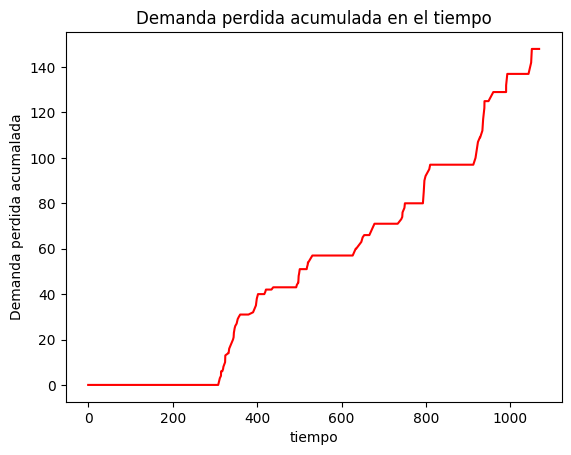

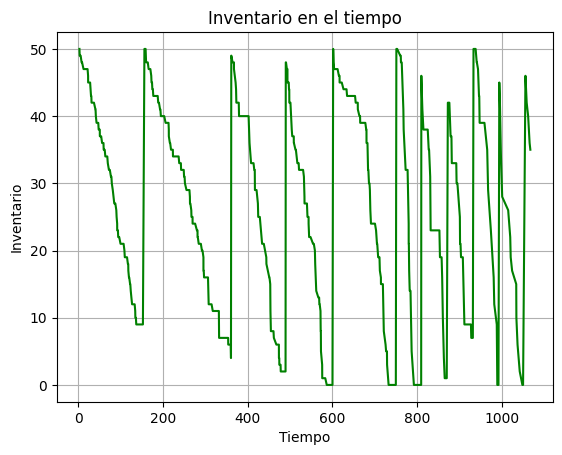

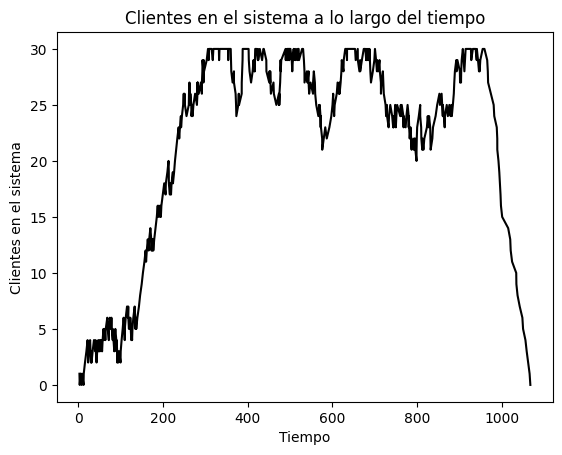

In [27]:
utilidades, clientes_perdidos, clientes_sistema,  inventario_sistema, perdidos_sistema = simulacion_sopaipillas(10,50,30,30,2123, True)

dominio = []
perdidos = []
for i in range(len(perdidos_sistema)):
    dominio.append((perdidos_sistema[i][1]))
    perdidos.append(perdidos_sistema[i][0])
domino = dominio
perdidos = (perdidos)

sns.lineplot(x = dominio, y = perdidos, color = 'red')
plt.title('Demanda perdida acumulada en el tiempo')
plt.ylabel('Demanda perdida acumalada')
plt.xlabel('tiempo')
plt.show()

inv = []
T = []
for i in range(len((inventario_sistema))):
    inv.append(inventario_sistema[i][0])
    T.append(inventario_sistema[i][1])
sns.lineplot(x = T, y = inv, color = 'green')
plt.grid()
plt.xlabel('Tiempo')
plt.ylabel('Inventario')
plt.title('Inventario en el tiempo')
plt.show()

T = []
cl = []
for i in range(len(clientes_sistema)):
    T.append(clientes_sistema[i][1])
    cl.append(clientes_sistema[i][0])
sns.lineplot(x = T, y = cl, color = 'black')
plt.xlabel('Tiempo')
plt.ylabel('Clientes en el sistema')
plt.title('Clientes en el sistema a lo largo del tiempo')
plt.show()



## Pregunta 3, parte b

In [28]:
def replica(s, S, tau, K, peso):
    #Se realizan 100 replicas/100 corridas diarias:
    resultado = []
    semillas = [i * peso  for i in range(100)]
    for i in range(100):
        semilla = semillas.pop()
        utils, clientes_perdidos, clientes_sistema,  inventario_sistema, perdidos_sistema = simulacion_sopaipillas(s, S, tau, K, semilla)
        resultado.append(utils)
    return np.mean(resultado)

def replicas(s, S, tau, K, n_replicas = 10):
    resultado = []
    pesos = [i for i in range(1, n_replicas + 1)]
    for i in range(n_replicas): #Se realizan 10 replicas, el equivalente a emular 1000 dias <=> casi tres años
        peso = pesos.pop()
        resultado.append(replica(s, S, tau, K, peso))
    return resultado

vidal = replicas(30, 45, 30, 15)
p3 = replicas(28, 43, 33, 10)

n = 10

X = np.mean(p3)
VX = np.var(p3, ddof = 1)

t = stats.t.ppf(0.975, n-1)
liminf = X - t * math.sqrt(VX/n)
limsup = X + t * math.sqrt(VX/n)
print(f'Intervalo de confianza política propia: [{liminf}, {limsup}]')

Y = np.mean(vidal)
VY = np.var(vidal, ddof = 1)
liminf = Y - t * math.sqrt(VY/n)
limsup = Y + t * math.sqrt(VY/n)
print(f'Intervalo de confianza Vidal: [{liminf}, {limsup}]')

print('========')
print(f'media vidal: {np.mean(vidal)}')
print(f'media política propia: {np.mean(p3)}')
print('========')

[17974. 19055.   150. 21000. 19500. 22500.]
100179.0
165600
[17776. 19790.   750. 18900. 19500. 29000.]
105716.0
170700
[17732. 18910.     0. 25200. 19500. 24000.]
105342.0
169200
[18194. 18880.     0. 35400. 19500. 19000.]
110974.0
160200
[17292. 19215.     0. 21000. 19500. 16000.]
93007.0
169500
[17512. 19880.   400. 14100. 19500. 24500.]
95892.0
175200
[18062. 17955.     0. 13800. 19500. 13500.]
82817.0
156900
[19316. 18600.   450. 36900. 19500. 33500.]
128266.0
157800
[19074. 16650.   300. 39600. 19500. 23500.]
118624.0
144000
[18722. 16495.   950. 49800. 19500.  4000.]
109467.0
142500
[16808. 20040.     0.  9900. 19500.  8500.]
74748.0
171900
[16434. 22000.   400. 12300. 19500. 21500.]
92134.0
189000
[16984. 17880.    50. 32400. 19500.     0.]
86814.0
156000
[18810. 17000.     0. 21000. 19500. 23000.]
99310.0
144600
[16852. 19350.   300. 16200. 19500.  9500.]
81702.0
167400
[16742. 20160.     0. 13800. 19500.  8500.]
78702.0
174600
[17930. 18020.   900. 22800. 19500. 11500.]
90650

## Pregunta 3 c)

In [ ]:
tamaño = []
dominio = []
t = stats.t.ppf(0.975, n-1)
for i in range(100, 1001, 100):
    print(i/1000)
    Vi = np.var(replicas(28, 43, 33, 10, n_replicas= i), ddof = 1)
    d = 2 * t * math.sqrt(Vi / i)
    tamaño.append(float(d))
    dominio.append(i)

sns.lineplot(x = dominio, y = tamaño)
plt.title('Evolución del largo de intervalos de confianza según número de réplicas')
plt.xlabel('Número de réplicas')
plt.ylabel('largo del intervalo')
plt.grid()
plt.show()

0.1
[15598. 16019.   550. 54900. 15600. 23500.]
126167.0
136800
[14168. 17317.   150. 43800. 15600. 14000.]
105035.0
155400
[15202. 16089.   600. 33000. 15600. 24500.]
104991.0
138300
[14476. 17002.   250. 39300. 15600. 16000.]
102628.0
153300
[13200. 18453.  1600. 21000. 15600.  3000.]
72853.0
162000
[15642. 16811.  1550. 26700. 15600. 28500.]
104803.0
150900
[14322. 17387.   150. 45300. 15600. 10500.]
103259.0
158100
[15158. 15688.  1200. 39600. 15600.  8500.]
95746.0
137700
[13288. 19175.   400. 18900. 15600. 15000.]
82363.0
166200
[13288. 18332.   350. 36600. 15600.  9000.]
93170.0
158100
[15246. 17037.   750. 28800. 15600. 20000.]
97433.0
145200
[13552. 18316.   800. 21300. 15600.  3500.]
73068.0
159000
[13684. 18577.   200. 16800. 15600. 13500.]
78361.0
164100
[14762. 18211.   900. 29100. 15600. 20500.]
99073.0
155100
[15180. 17721.   450. 25200. 15600. 20500.]
94651.0
151500
[14212. 17772.   650. 40800. 15600. 13500.]
102534.0
160500
[12276. 20486.  1250. 14700. 15600.     0.]
6